# Overview

This is an exploratory data analysis on the House Prices Kaggle Competition found at
https://www.kaggle.com/c/house-prices-advanced-regression-techniques

## Description

If you ask a person who wants to buy a house to describe their dream home, they probably won't start by talking about how high the basement ceiling is or how close it is to an east-west railway. But the data from this playground competition shows that more than the number of bedrooms or a white-picket fence affects price negotiations.

This competition asks you to guess the final price of each home in Ames, Iowa, based on 79 variables that describe (almost) everything about them.

There are **1460 training data** and **1460 test data**. There are a total of 81 attributes, 36 of which are numbers, 43 of which are groups of numbers, plus Id and SalePrice.


### Numerical Features
1stFlrSF, 2ndFlrSF, 3SsnPorch, BedroomAbvGr, BsmtFinSF1, BsmtFinSF2, BsmtFullBath, BsmtHalfBath, BsmtUnfSF, EnclosedPorch, Fireplaces, FullBath, GarageArea, GarageCars, GarageYrBlt, GrLivArea, HalfBath, KitchenAbvGr, LotArea, LotFrontage, LowQualFinSF, MSSubClass, MasVnrArea, MiscVal, MoSold, OpenPorchSF, OverallCond, OverallQual, PoolArea, ScreenPorch, TotRmsAbvGrd, TotalBsmtSF, WoodDeckSF, YearBuilt, YearRemodAdd, YrSold

### Categorical Features
Alley, BldgType, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, BsmtQual, CentralAir, Condition1, Condition2, Electrical, ExterCond, ExterQual, Exterior1st, Exterior2nd, Fence, FireplaceQu, Foundation, Functional, GarageCond, GarageFinish, GarageQual, GarageType, Heating, HeatingQC, HouseStyle, KitchenQual, LandContour, LandSlope, LotConfig, LotShape, MSZoning, MasVnrType, MiscFeature, Neighborhood, PavedDrive, PoolQC, RoofMatl, RoofStyle, SaleCondition, SaleType, Street, Utilitif

In [1]:
numFeatures =  ["1stFlrSF","2ndFlrSF","3SsnPorch","BedroomAbvGr","BsmtFinSF1","BsmtFinSF2","BsmtFullBath","BsmtHalfBath","BsmtUnfSF","EnclosedPorch","Fireplaces","FullBath","GarageArea","GarageCars","GarageYrBlt","GrLivArea","HalfBath","KitchenAbvGr","LotArea","LotFrontage","LowQualFinSF","MSSubClass","MasVnrArea","MiscVal","MoSold","OpenPorchSF","OverallCond","OverallQual","PoolArea","ScreenPorch","TotRmsAbvGrd","TotalBsmtSF","WoodDeckSF","YearBuilt","YearRemodAdd","YrSold"]



## Imports and Download Data

In [2]:
import pandas as pd
import numpy as np
from copy import deepcopy
import scipy.stats as st
from sklearn import ensemble, tree, linear_model
import missingno as msno

#plotting lib
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px


# enable comparing table side by side
from IPython.display import display, HTML

CSS = """
.output {
    flex-direction: row;
}
"""

HTML('<style>{}</style>'.format(CSS))

In [3]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler,quantile_transform


In [4]:
!kaggle competitions download -c house-prices-advanced-regression-techniques
!unzip house-prices-advanced-regression-techniques.zip -d ./data -y

house-prices-advanced-regression-techniques.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  house-prices-advanced-regression-techniques.zip
caution: filename not matched:  -y


In [5]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')

# Getting Started

Obtaining a simple summary of your data is a fundamental first step in this direction. Thus, the term "basic description of your data" is somewhat general, since it can mean anything from "a quick and dirty approach to get some information on your data" to "a means to get some simple, easy-to-understand information on your data" or even "a way to get a basic feel for your data." When using the describe() function, we can obtain several types of summary statistics, all of which will be free of NaN values.

There are two factors mostly observed in EDA exercise which are missing values and outliers. which we will cover missing value first and then we well have good look at the outliers.


In [6]:
display(train.describe().T)
# display(test.describe().T)

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


## Looking at the missing number

Several approaches to examine missing data in a dataset are:

1. **Missing data patterns**: Examine your data's missingness patterns before studying it. Bar charts, heatmaps, and dendrograms can help. These visualisations might help you determine whether missing data is random or non-random and whether missing values in distinct variables are related.

2. **Missing data imputation**: Estimating missing values is another method for studying missing data. Imputation methods include mean, median, regression, and many.

3. **Data reduction** : If a lot of data is missing, lower the number of variables or cases. Principal component analysis, factor analysis, and data clustering can do this.

4. **Sensitivity analysis**: This method tests conclusions by changing missing data assumptions. It can identify if an analysis is sensitive to missing data handling.

5. **Model-based analysis**: In model-based analysis, missing data is treated as an additional variable, and a statistical model estimates the associations between the missing values and the other variables in the dataset.


### Finding the pattern and imputation


The library ["Missingno"](https://github.com/ResidentMario/missingno) is a library that provides a set of tools for visualizing and analyzing missing data. It's commonly used in data science and machine learning projects to help identify and handle missing or incomplete data in datasets.

Missingno can generate a variety of visualizations to help us understand the distribution and patterns of missing values in their data, including bar charts, heatmaps, and dendrograms. It can also be used to impute missing values or drop them entirely from a dataset.

Text(0.5, 1.0, 'Raw Data Completeness')

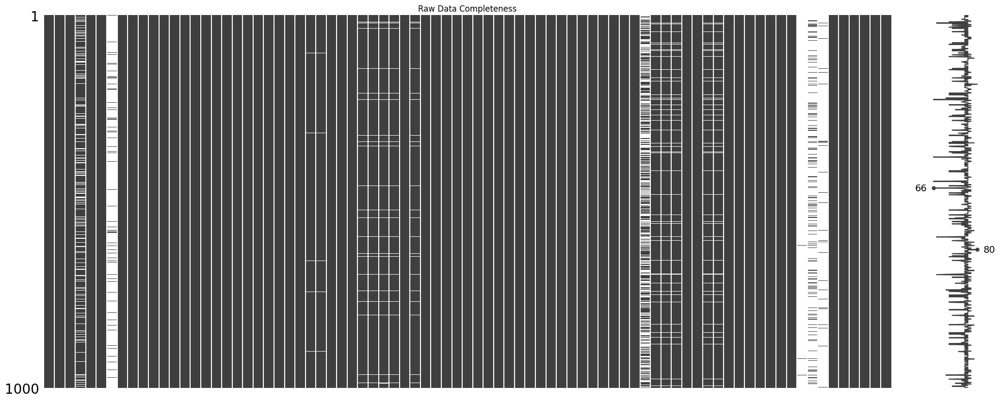

In [7]:
ax = msno.matrix(train.sample(1000))
ax.set_title("Raw Data Completeness")

Text(0.5, 1.0, 'Data Completeness visualisation')

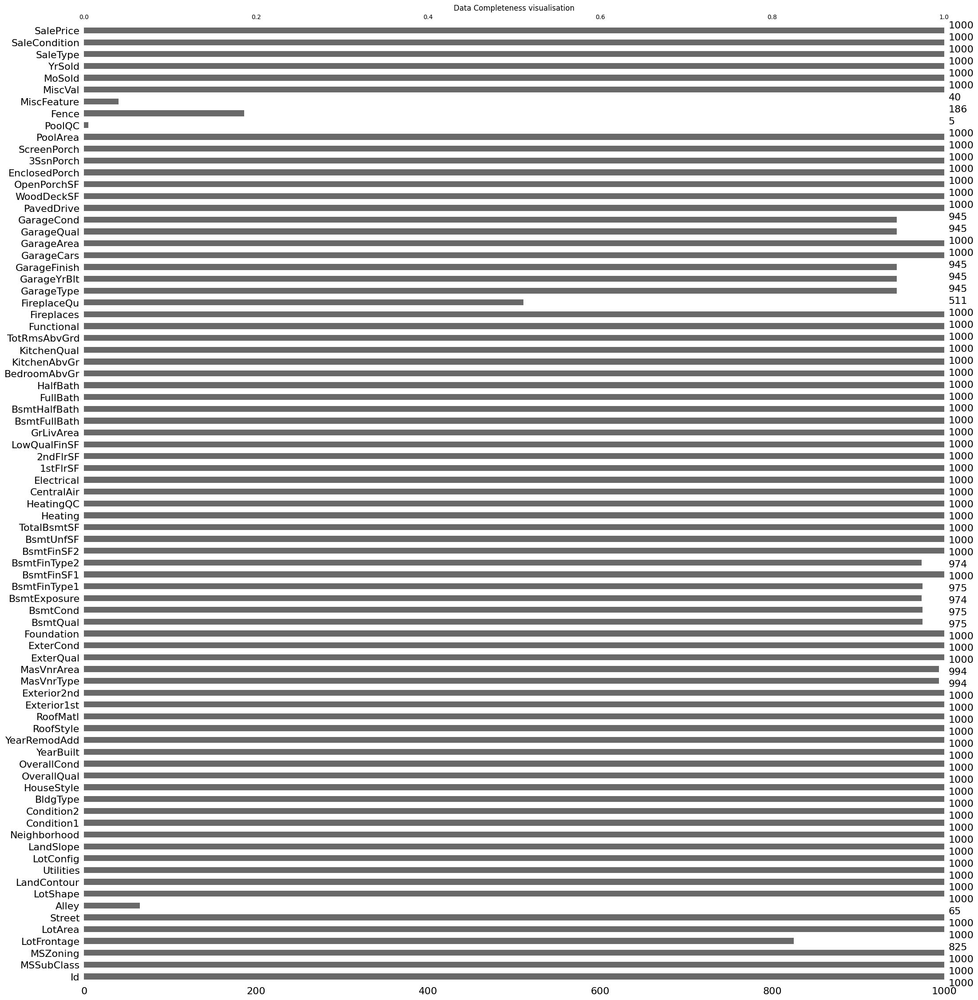

In [8]:
ax = msno.bar(train.sample(1000))
ax.set_title("Data Completeness visualisation")

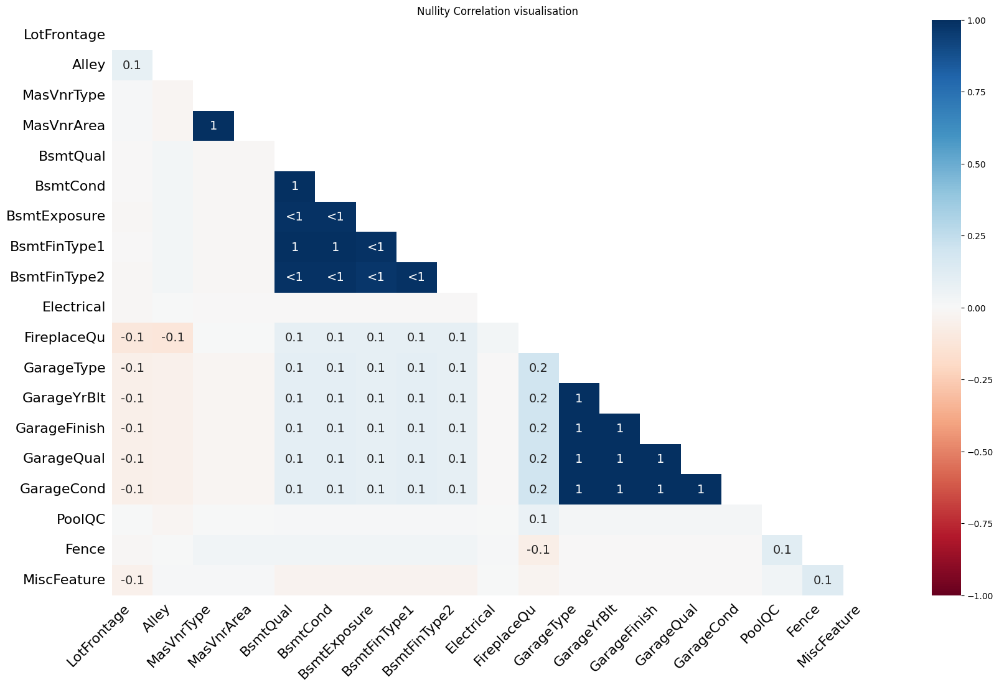

In [9]:
ax = msno.heatmap(train)
_ = ax.set_title("Nullity Correlation visualisation")

#### Nullity correlation and Dendrogram
The range of nullity correlation is from -1 (if one variable appears, the other surely does not) to 0 (if the presence or absence of one variable has no effect on the other) to 1. (if one variable appears the other definitely also does). You can quickly see that the *Garage* group and the *Bsmt* group are very correlated in the *Nullity Correlation visualisation* chart.

And below will be displaying the heirachy of missing values. which allows us to look deeper in to how things could be collected. for example 

1. GarageCond and other Garage_ features are likely depended on each other or might be collected at the sametime
2. interms of data collection, listing Fence might be more important than getting MiscFeature.

<AxesSubplot: >

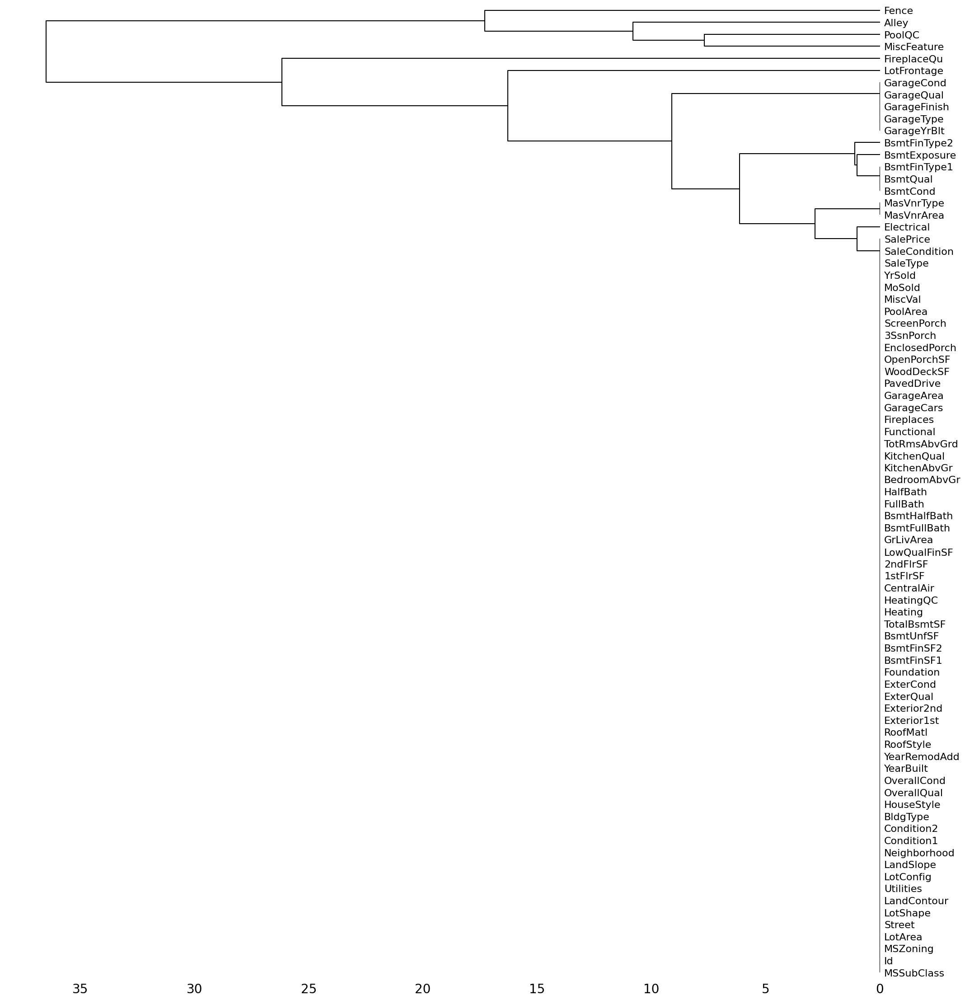

In [10]:
msno.dendrogram(train)

## Data Skewness

We can quickly look through all of our data distribution and skewness by min max scaling and make a box plot containing all of the numerical features

In [11]:
# Performs deepcopy to explore without consequence
cp_train = deepcopy(train)
cp_train[numFeatures] = MinMaxScaler().fit_transform(train[numFeatures])

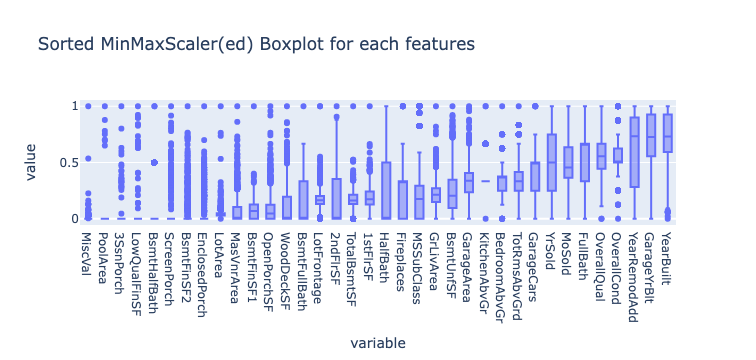

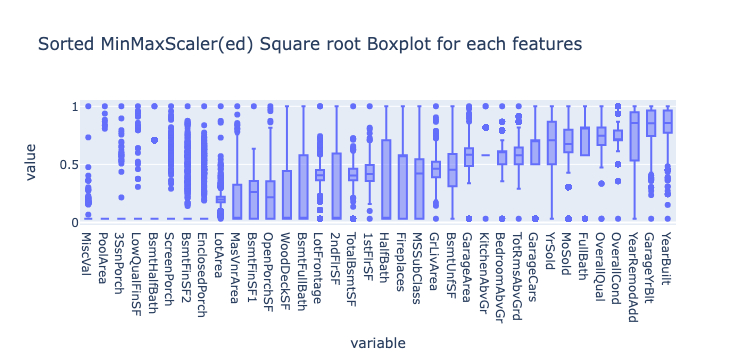

In [12]:
sorted_means = cp_train[numFeatures].apply("mean").sort_values()
fig = px.box(
    cp_train, 
    y=sorted_means.index, 
    title="Sorted MinMaxScaler(ed) Boxplot for each features")
display(fig)

sorted_means = cp_train[numFeatures].apply("mean").sort_values()
fig = px.box(
    cp_train[sorted_means.index].apply(lambda x : np.sqrt(1e-3+x)), 
    y=sorted_means.index,
    title="Sorted MinMaxScaler(ed) Square root Boxplot for each features")
display(fig)

From *Sorted MinMaxScaler(ed) of Boxplot for each features* we can see that most of our data are positively skewed which is something to keep in mind. **The negatively skewed features are revolving around year being remodelled built** which we could remove the bias by simply subtracting a constant.

the features that we will quickly look into the outliers is the lower means one as the graphs shows that most of the values are clustered around 0 which are

"MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHaldBatch", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"

and we will see that it resemble sparse matrix

## Outliers

First we will look at the data that is really skewed that we have mentioned 

In [13]:
dat = train[
    ["MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHalfBath", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"]
]
display(dat.describe())
display(dat)

,MiscVal,PoolArea,3SsnPorch,LowQualFinSF,BsmtHalfBath,ScreenPorch,BsmtFinSF2,EnclosedPorch
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,43.489041,2.758904,3.409589,5.844521,0.057534,15.060959,46.549315,21.954110
std,496.123024,40.177307,29.317331,48.623081,0.238753,55.757415,161.319273,61.119149
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15500.000000,738.000000,508.000000,572.000000,2.000000,480.000000,1474.000000,552.000000


,MiscVal,PoolArea,3SsnPorch,LowQualFinSF,BsmtHalfBath,ScreenPorch,BsmtFinSF2,EnclosedPorch
0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,272
4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
1455,0,0,0,0,0,0,0,0
1456,0,0,0,0,0,0,163,0
1457,2500,0,0,0,0,0,0,0
1458,0,0,0,0,0,0,1029,112


In [14]:
_feat = ["MiscVal", "PoolArea", "3SsnPorch", "LowQualFinSF", "BsmtHalfBath", "ScreenPorch","BsmtFinSF2", "EnclosedPorch"]
cp_train = deepcopy(train)
cp_train[_feat] = cp_train[_feat]>0

from sklearn.decomposition import SparsePCA
sparse_pca = SparsePCA(n_components=2, alpha=0.1)
cp_train[["PCA1","PCA2"]]= sparse_pca.fit_transform(cp_train[_feat]*1)




In [15]:
selector = cp_train[_feat].apply(lambda x : x.any(),axis=1)

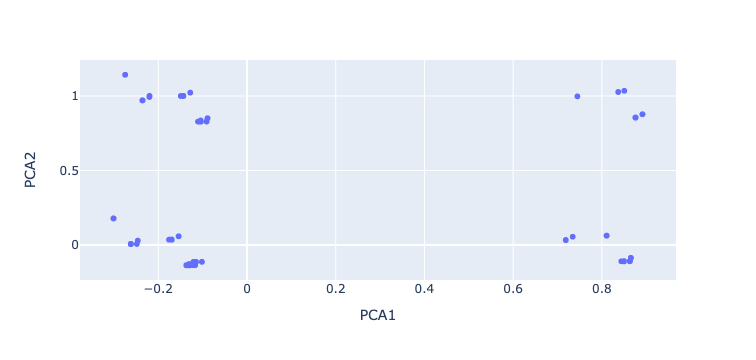

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/plotly/express/_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



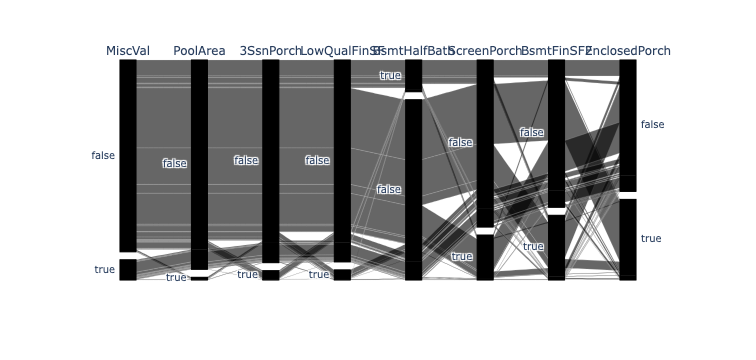

In [16]:
fig = px.scatter(cp_train,x="PCA1", y="PCA2")
fig.show()
fig = px.parallel_categories(cp_train[selector], dimensions=_feat,
                color="MiscVal", color_continuous_scale=px.colors.sequential.Inferno)
fig.show()